In [1]:
import torch_geometric
import torch
import os
import anndata
import numpy as np
import scanpy as sc
from scipy.sparse import csr_matrix
from scvi.dataset import CortexDataset
from scETM import evaluate
from typing import *
from torch_geometric.data import Data, DataLoader, InMemoryDataset
from tqdm import trange, tqdm
from torch_geometric.utils import (negative_sampling, remove_self_loops, add_self_loops)
import matplotlib.pyplot as plt
sc.set_figure_params(figsize=(10, 10), fontsize=10, dpi=120, dpi_save=250)

In [2]:
class norm_act_drop(torch.nn.Module):
    def __init__(self, size: int, norm_module: str, activation: str, dropout_prob: float, final_layer: bool = False):
        super().__init__()
        self.norm = self.get_norm_layer(size, norm_module) if norm_module != 'none' else None
        self.activation, self.dropout = None, None
        if not final_layer:
            self.activation = getattr(torch.nn, activation)()
            self.dropout = torch.nn.Dropout(dropout_prob) if dropout_prob else None

    @staticmethod
    def get_norm_layer(size, norm_module='none'):
        if norm_module == 'none':
            return torch.nn.Identity()
        elif norm_module == 'batch':
            return torch.nn.BatchNorm1d(size)
        elif norm_module == 'instance':
            return torch.nn.InstanceNorm1d(size)
        elif norm_module == 'layer':
            return torch.nn.LayerNorm(size)
        else:
            return NotImplementedError(f"Not Implemented norm layer {norm_module}")

    def forward(self, x):
        if self.norm is not None:
            x = self.norm(x)
        if self.activation is not None:
            x = self.activation(x)
        if self.dropout is not None:
            x = self.dropout(x)
        return x

class Encoder(torch.nn.Module):
    def __init__(self, in_channels, hidden_sizes: Sequence[int] = (64, 64), out_channels: int = 32, pre_norm_act_drop: bool = True):
        super().__init__()
        self.pre_layers = torch.nn.ModuleList()
        self.layers = torch.nn.ModuleList()
        for i, size in enumerate(list(hidden_sizes) + [out_channels * 2]):
            if i == 0 and not pre_norm_act_drop:
                self.pre_layers.append(torch.nn.Identity())
            else:
                self.pre_layers.append(norm_act_drop(in_channels, norm_module='none', activation='ELU', dropout_prob=0.1))
            self.layers.append(torch_geometric.nn.GCNConv(in_channels, size, cached=True, add_self_loops=False))
            in_channels = size

    def forward(self, x: torch.Tensor, edge_index: torch.Tensor, edge_weight: Union[None, torch.Tensor] = None) -> Tuple[torch.Tensor, torch.Tensor]:
        for layer, pre_layer in zip(self.layers, self.pre_layers):
            x = pre_layer(x)
            x = layer(x, edge_index=edge_index, edge_weight=edge_weight)
        mu, logsigma = x.chunk(2, dim=-1)
        return mu, logsigma


class WrappedEncoder(torch.nn.Module):
    def __init__(self, in_channels,
        extractor_hidden_sizes: Union[None, Sequence[int]] = (128,),
        encoder_in_channels: int = 50,
        encoder_hidden_sizes: Sequence[int] = (64, 64),
        out_channels: int = 32
    ):
        super().__init__()
        if extractor_hidden_sizes is not None:
            layers = []
            for size in extractor_hidden_sizes:
                layers.append(torch.nn.Linear(in_channels, size))
                layers.append(norm_act_drop(size, norm_module='none', activation='ReLU', dropout_prob=0.1))
                in_channels = size
            layers.append(torch.nn.Linear(in_channels, encoder_in_channels))
            self.extractor = torch.nn.Sequential(*layers)
            self.encoder = Encoder(encoder_in_channels, encoder_hidden_sizes, out_channels)
        else:
            self.extractor = torch.nn.Identity()
            self.encoder = Encoder(in_channels, encoder_hidden_sizes, out_channels, pre_norm_act_drop = False)
        
    
    def forward(self, x: torch.Tensor, edge_index: torch.Tensor, edge_weight: Union[None, torch.Tensor] = None) -> Tuple[torch.Tensor, torch.Tensor]:
        return self.encoder(self.extractor(x), edge_index=edge_index, edge_weight=edge_weight)


class WeightedVGAE(torch_geometric.nn.VGAE):
    def __init__(self, encoder, decoder = None):
        super().__init__(encoder, decoder)

    def recon_loss(self, z, pos_edge_index, edge_weight, neg_edge_index=None):
        r"""Given latent variables :obj:`z`, computes the binary cross
        entropy loss for positive edges :obj:`pos_edge_index` and negative
        sampled edges.

        Args:
            z (Tensor): The latent space :math:`\mathbf{Z}`.
            pos_edge_index (LongTensor): The positive edges to train against.
            neg_edge_index (LongTensor, optional): The negative edges to train
                against. If not given, uses negative sampling to calculate
                negative edges. (default: :obj:`None`)
        """

        pos_loss = -torch.log(self.decoder(z, pos_edge_index, sigmoid=True) + 1e-15) @ edge_weight

        # Do not include self-loops in negative samples
        pos_edge_index, _ = remove_self_loops(pos_edge_index)
        # pos_edge_index, _ = add_self_loops(pos_edge_index)
        if neg_edge_index is None:
            neg_edge_index = negative_sampling(pos_edge_index, z.size(0))
        neg_loss = -torch.log(1 -
                              self.decoder(z, neg_edge_index, sigmoid=True) +
                              1e-15).mean()

        return pos_loss, neg_loss

In [3]:
def train_gnn(dataloader: DataLoader, model: WeightedVGAE, optimizer: torch.optim.Optimizer, kl_weight: float = 1.0, device: torch.device = torch.device('cuda')):
    model.train()

    total_pos = total_neg = total_kl = total_norms = 0.
    for data in dataloader:
        data = data.to(device)

        z = model.encode(data.x, edge_index=data.edge_index, edge_weight=data.edge_weight)
        pos_loss, neg_loss = model.recon_loss(z, data.edge_index, data.edge_weight)
        kl_loss = model.kl_loss()

        loss = pos_loss + neg_loss + kl_weight * kl_loss
        total_pos += pos_loss.item()
        total_neg += neg_loss.item()
        total_kl += kl_loss.item()

        loss.backward()
        norms = torch.nn.utils.clip_grad_norm_(model.parameters(), 50)
        total_norms += norms.item()

        optimizer.step()

    return total_pos, total_neg, total_kl, total_norms

def get_kl_weight(max_kl_weight, epoch, turning_point):
    return max_kl_weight * min(1, epoch / turning_point)

In [4]:
class SingleCellDataset(InMemoryDataset):
    def __init__(self, adata, transform=None, pre_transform=None, pre_filter=None, bandwidth: float = 3, raw=False, resolutions=(0.01,)):
        super().__init__(None, transform, pre_transform, pre_filter)

        sc.pp.normalize_total(adata, 1e4)
        sc.pp.log1p(adata)
        sc.pp.scale(adata)

        if raw:
            X = adata.X.copy()

        sc.pp.pca(adata)
        evaluate(adata, embedding_key='X_pca', return_fig = True, resolutions = resolutions, n_jobs=1)

        def knn_indices_to_edge_index(knn_indices: np.ndarray) -> np.ndarray:
            ncells, k = knn_indices.shape
            u = np.repeat(np.arange(0, ncells), k)
            v = knn_indices.flatten()
            return np.vstack([u, v])
        edge_index = knn_indices_to_edge_index(adata.obsm['knn_indices'])

        def distances_to_weight(distances: csr_matrix, edge_index: np.ndarray, bandwidth: float) -> np.ndarray:
            distances = distances.toarray()[edge_index[0], edge_index[1]]
            return np.exp(-bandwidth / 2 * distances)
        edge_weight = distances_to_weight(adata.obsp['distances'], edge_index, bandwidth = bandwidth / np.sqrt(adata.n_vars))
        print(edge_weight[:30])

        data = Data(
            x = torch.FloatTensor(X) if raw else torch.FloatTensor(adata.obsm['X_pca'].copy()),
            edge_index = torch.LongTensor(edge_index),
            edge_weight = torch.FloatTensor(edge_weight)
        )

        self.data, self.slices = self.collate([data])

In [5]:
n_epochs = 2400
eval_every = 800
kl_weight = 1
kl_turning_point = 500
bandwidth = 36
raw = False
resolutions = (0.24, 0.32, 0.48, 0.64, 0.8, 1, 1.3)
# resolutions = (0.04, 0.06, 0.08, 0.12, 0.16, 0.24, 0.32, 0.48, 0.64)

[2021-04-28 19:14:44,853] INFO - scETM.logging_utils: evaluate(AnnData object with n_obs × n_vars = 44949 × 22964
    obs: 'tissue_new', 'Neurog3>0_raw', 'Neurog3>0_scaled', 'cell_ontology_class', 'cell_ontology_id', 'cluster.ids', 'free_annotation', 'mouse.id', 'mouse.sex', 'plate.barcode', 'subsetA', 'subsetA_cluster.ids', 'subsetB', 'subsetB_cluster.ids', 'subsetC', 'subsetC_cluster.ids', 'subsetD', 'subsetD_cluster.ids', 'subsetE', 'subsetE_cluster.ids', 'subtissue', 'tissue', 'tissue_tSNE_1', 'tissue_tSNE_2', 'ercc_perc', 'ribo_perc', 'rn45s_perc', 'n_genes', 'n_counts', 'cell_types', 'batch_indices'
    var: 'n_counts', 'mean', 'std'
    uns: 'log1p', 'pca'
    obsm: 'X_pca'
    varm: 'PCs', embedding_key = X_pca, return_fig = True, resolutions = (0.24, 0.32, 0.48, 0.64, 0.8, 1, 1.3), n_jobs = 1)
[2021-04-28 19:15:02,250] INFO - scETM.eval_utils: Performing leiden clustering
[2021-04-28 19:15:18,225] INFO - scETM.eval_utils: Resolution:  0.24	ARI:  0.6531	NMI:  0.8264	bARI:  0.01

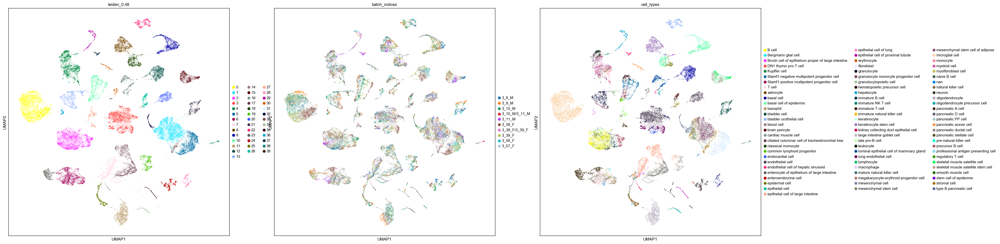

In [6]:
# adata = CortexDataset('../../../data/cortex').to_anndata()
# dataset_name = 'cortex'
adata = anndata.read_h5ad("../../../data/TM/FACS.h5ad")
adata.obs['cell_types'] = adata.obs.cell_ontology_class
adata.obs['batch_indices'] = adata.obs['mouse.id']
dataset_name = 'TM'
dataset = SingleCellDataset(adata = adata, bandwidth = bandwidth, raw=raw, resolutions = resolutions)
dataloader = DataLoader(dataset=dataset, batch_size=1, shuffle=False)

In [7]:
model = WeightedVGAE(WrappedEncoder(dataset.num_features, extractor_hidden_sizes = tuple() if raw else None)).to(torch.device('cuda'))
print(model)
optimizer = torch.optim.Adam(model.parameters(), lr = 1e-4)

WeightedVGAE(
  (encoder): WrappedEncoder(
    (extractor): Identity()
    (encoder): Encoder(
      (pre_layers): ModuleList(
        (0): Identity()
        (1): norm_act_drop(
          (activation): ELU(alpha=1.0)
          (dropout): Dropout(p=0.1, inplace=False)
        )
        (2): norm_act_drop(
          (activation): ELU(alpha=1.0)
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
      (layers): ModuleList(
        (0): GCNConv(50, 64)
        (1): GCNConv(64, 64)
        (2): GCNConv(64, 64)
      )
    )
  )
  (decoder): InnerProductDecoder()
)


  0%|                                                  | 0/2400 [00:00<?, ?it/s][2021-04-28 19:20:21,785] INFO - scETM.logging_utils: evaluate(AnnData object with n_obs × n_vars = 44949 × 22964
    obs: 'tissue_new', 'Neurog3>0_raw', 'Neurog3>0_scaled', 'cell_ontology_class', 'cell_ontology_id', 'cluster.ids', 'free_annotation', 'mouse.id', 'mouse.sex', 'plate.barcode', 'subsetA', 'subsetA_cluster.ids', 'subsetB', 'subsetB_cluster.ids', 'subsetC', 'subsetC_cluster.ids', 'subsetD', 'subsetD_cluster.ids', 'subsetE', 'subsetE_cluster.ids', 'subtissue', 'tissue', 'tissue_tSNE_1', 'tissue_tSNE_2', 'ercc_perc', 'ribo_perc', 'rn45s_perc', 'n_genes', 'n_counts', 'cell_types', 'batch_indices', 'leiden_0.24', 'leiden_0.32', 'leiden_0.48', 'leiden_0.64', 'leiden_0.8', 'leiden_1', 'leiden_1.3'
    var: 'n_counts', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'leiden', 'umap', 'leiden_0.48_colors', 'batch_indices_colors', 'cell_types_colors'
    obsm: 'X_pca', 'knn_indices', 'X_umap', 'VGAE'

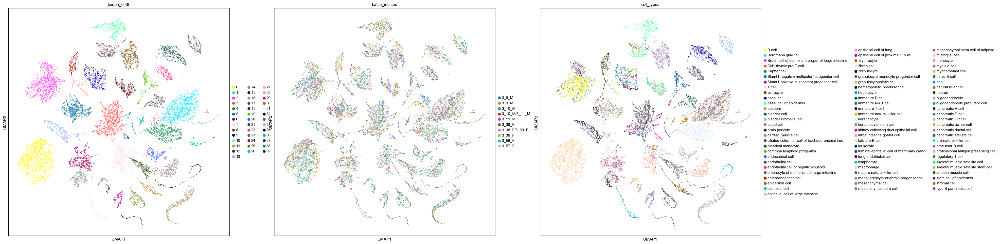

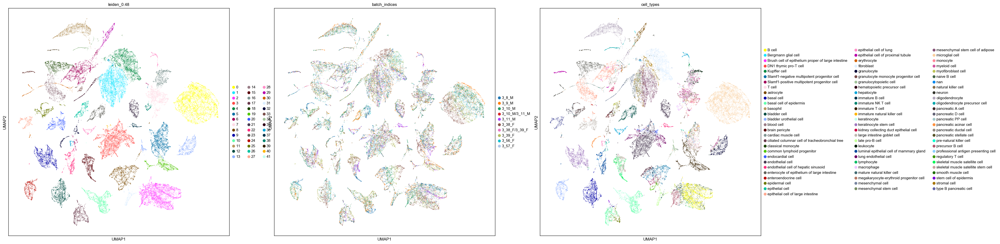

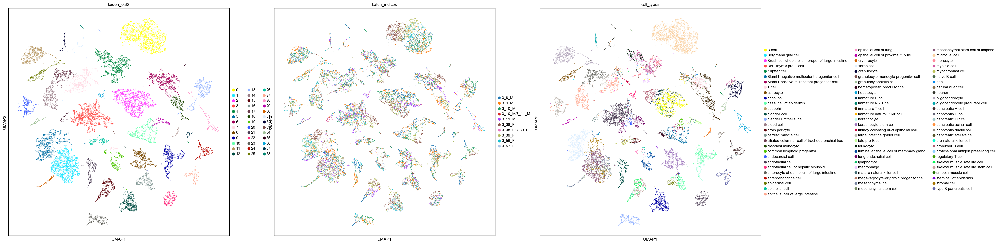

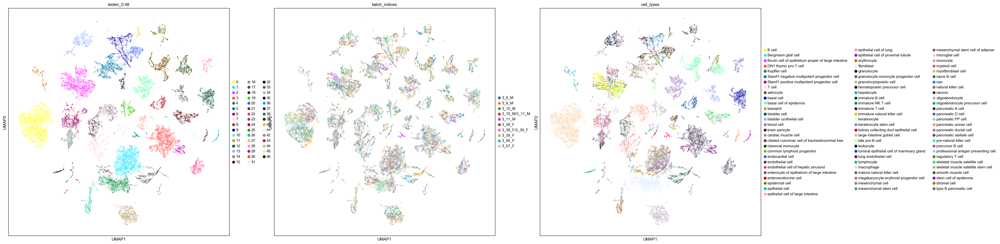

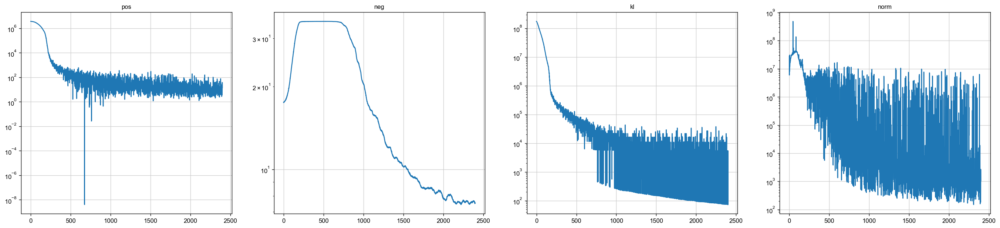

In [8]:
ckpt_dir = f'../results/WVGAE/{dataset_name}_linearExtractor_beta{kl_weight}_bw{bandwidth}{"_raw" if raw else ""}'
os.makedirs(ckpt_dir, exist_ok=True)
results = {}
poses, negs, kls, norms = [], [], [], []

for epoch in tqdm(list(range(n_epochs)), ncols=80, position=0):
    pos, neg, kl, norm = train_gnn(dataloader, model, optimizer, kl_weight = get_kl_weight(kl_weight, epoch, kl_turning_point))
    poses.append(pos)
    negs.append(neg)
    kls.append(kl)
    norms.append(norm)

    if not epoch or (epoch + 1) % eval_every == 0:
        model.eval()
        data = dataset[0].to(torch.device('cuda'))
        mu, _ = model.encoder(data.x, edge_index=data.edge_index, edge_weight=data.edge_weight)
        adata.obsm['VGAE'] = mu.detach().cpu().numpy()
        result = evaluate(adata, embedding_key='VGAE', return_fig=True, resolutions=resolutions, plot_dir=ckpt_dir, plot_fname=f'VGAE_{epoch}', n_jobs=1)
        results[epoch] = result

fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, figsize=(28, 6))
ax1.plot(range(n_epochs), poses)
ax1.set_title('pos')
ax1.set_yscale('log')
ax2.plot(range(n_epochs), negs)
ax2.set_title('neg')
ax2.set_yscale('log')
ax3.plot(range(n_epochs), kls)
ax3.set_title('kl')
ax3.set_yscale('log')
ax4.plot(range(n_epochs), norms)
ax4.set_title('norm')
ax4.set_yscale('log')
fig.savefig(os.path.join(ckpt_dir, 'loss.png'), bbox_inches='tight', dpi=300)